In [30]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import datetime
from sklearn.decomposition import KernelPCA

In [2]:
electricity = pd.read_csv('ele.csv')
electricity

,Unnamed: 0,mels_S,lig_S,lig_N,mels_N,hvac_N,hvac_S
0,2018-01-01 00:00:00+00:00,NaN,NaN,NaN,NaN,36.000000,22.500000
1,2018-01-01 00:30:00+00:00,NaN,NaN,NaN,NaN,37.700001,19.200001
2,2018-01-01 01:00:00+00:00,1.250000,0.200000,NaN,7.150000,37.450001,19.695000
3,2018-01-01 01:30:00+00:00,1.150000,0.200000,NaN,7.550000,37.600000,19.094999
4,2018-01-01 02:00:00+00:00,1.100000,0.200000,NaN,7.300000,37.300001,24.800000
...,...,...,...,...,...,...,...
35036,2019-12-31 22:00:00+00:00,1.795833,0.005556,NaN,8.585667,22.446974,23.104355
35037,2019-12-31 22:30:00+00:00,1.827083,0.000000,NaN,8.475536,23.469722,27.520789
35038,2019-12-31 23:00:00+00:00,1.754444,0.050000,NaN,8.572000,24.113158,25.355263
35039,2019-12-31 23:30:00+00:00,1.898889,0.386250,NaN,8.466270,24.302632,26.358289


In [3]:
weather = pd.read_csv('site_weather.csv')
weather

,Unnamed: 0,air_temp_set_1,air_temp_set_2,dew_point_temperature_set_1d,relative_humidity_set_1,solar_radiation_set_1
0,2018-01-01 00:00:00+00:00,11.565,11.465,8.120,79.585,66.290
1,2018-01-01 00:30:00+00:00,11.515,11.460,8.160,80.060,36.525
2,2018-01-01 01:00:00+00:00,11.030,11.080,8.015,81.850,4.130
3,2018-01-01 01:30:00+00:00,10.750,10.785,7.975,83.150,0.120
4,2018-01-01 02:00:00+00:00,10.785,10.835,7.975,82.950,0.000
...,...,...,...,...,...,...
35036,2019-12-31 22:00:00+00:00,16.090,14.280,4.780,47.320,408.200
35037,2019-12-31 22:30:00+00:00,17.085,14.750,3.785,41.405,330.150
35038,2019-12-31 23:00:00+00:00,17.885,15.150,2.845,36.820,282.100
35039,2019-12-31 23:30:00+00:00,17.410,15.320,2.780,37.790,212.350


In [4]:
day_col = [d.date() for d in pd.to_datetime(weather.iloc[:,0])]
time_col = [d.time() for d in pd.to_datetime(weather.iloc[:,0])]

In [5]:
#Check that the date time column is the same.
(electricity.iloc[:,0] == weather.iloc[:,0]).sum()

35041

In [6]:
electricity['Date'] = day_col
electricity['Time'] = time_col
electricity['hvac_tot'] = (electricity['hvac_N']+ electricity['hvac_S'])/2
ele_time = electricity.drop('Unnamed: 0', axis =1)[['Date', 'Time','hvac_tot']]

ele_time.head(2)

,Date,Time,hvac_tot
0,2018-01-01,00:00:00,29.250000
1,2018-01-01,00:30:00,28.450001


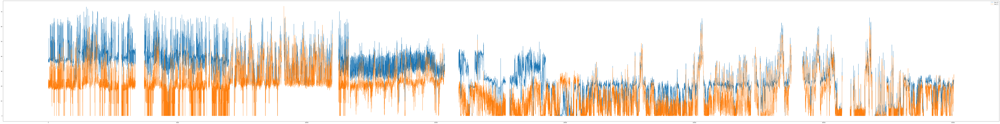

In [7]:
electricity.plot(y =['hvac_N','hvac_S'], kind='line',figsize =(160,20))
plt.legend()
plt.savefig('hvac_Nvshvac_S')

In [8]:
weather['Date'] = day_col
weather['Time'] = time_col
weather_time = weather.drop('Unnamed: 0', axis =1)[['Date', 'Time','air_temp_set_1', 'air_temp_set_2','dew_point_temperature_set_1d', 'relative_humidity_set_1', 'solar_radiation_set_1']]
weather_time.head(3)



,Date,Time,air_temp_set_1,air_temp_set_2,dew_point_temperature_set_1d,relative_humidity_set_1,solar_radiation_set_1
0,2018-01-01,00:00:00,11.565,11.465,8.120,79.585,66.290
1,2018-01-01,00:30:00,11.515,11.460,8.160,80.060,36.525
2,2018-01-01,01:00:00,11.030,11.080,8.015,81.850,4.130


In [9]:
e_nan = ele_time.isna()
e_nan_day = ele_time.iloc[e_nan.index[e_nan['hvac_tot']==True],:]['Date']
e_nan_day

642      2018-01-14
643      2018-01-14
644      2018-01-14
645      2018-01-14
646      2018-01-14
            ...    
34159    2019-12-13
34160    2019-12-13
34161    2019-12-13
34162    2019-12-13
34163    2019-12-13
Name: Date, Length: 3726, dtype: object

In [10]:
w_nan = weather_time.isna()
print(w_nan.index[w_nan.any(True)])
w_nan_day = weather_time.iloc[w_nan.index[w_nan.any(True)],:]['Date']
w_nan_day

Int64Index([ 1886,  8485,  9966,  9967,  9968,  9969,  9970,  9971,  9972,
             9973,
            ...
            23225, 23226, 23227, 23228, 32007, 33349, 33390, 33391, 33392,
            33393],
           dtype='int64', length=237)


1886     2018-02-09
8485     2018-06-26
9966     2018-07-27
9967     2018-07-27
9968     2018-07-27
            ...    
33349    2019-11-26
33390    2019-11-27
33391    2019-11-27
33392    2019-11-27
33393    2019-11-27
Name: Date, Length: 237, dtype: object

In [11]:
nan_days = list(set(e_nan_day.tolist()).union(set(w_nan_day.tolist())))
print(len(nan_days))
Y= ele_time[~ele_time['Date'].isin(nan_days)]
Y.head(4)

203


,Date,Time,hvac_tot
0,2018-01-01,00:00:00,29.250000
1,2018-01-01,00:30:00,28.450001
2,2018-01-01,01:00:00,28.572500
3,2018-01-01,01:30:00,28.347500


In [24]:
X = weather_time[~weather_time['Date'].isin(nan_days)]
X.head(-4)

,Date,Time,air_temp_set_1,air_temp_set_2,dew_point_temperature_set_1d,relative_humidity_set_1,solar_radiation_set_1
0,2018-01-01,00:00:00,11.565,11.465,8.120,79.585,66.290
1,2018-01-01,00:30:00,11.515,11.460,8.160,80.060,36.525
2,2018-01-01,01:00:00,11.030,11.080,8.015,81.850,4.130
3,2018-01-01,01:30:00,10.750,10.785,7.975,83.150,0.120
4,2018-01-01,02:00:00,10.785,10.835,7.975,82.950,0.000
...,...,...,...,...,...,...,...
35032,2019-12-31,20:00:00,14.670,12.675,5.785,55.500,445.400
35033,2019-12-31,20:30:00,14.705,12.815,5.535,54.420,409.850
35034,2019-12-31,21:00:00,15.300,13.205,5.675,52.895,443.650
35035,2019-12-31,21:30:00,15.805,13.820,5.290,49.875,327.450


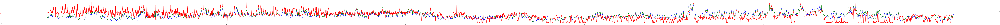

In [38]:
fig, ax1 = plt.subplots(figsize = (400,10))
ax1.set_ylabel('HVAC Average', color = 'red')
ax1.plot(range(len(X)) ,Y.hvac_tot, color = 'red')
ax2 = ax1.twinx()
ax2.set_ylabel('Air Temperature', color = 'blue')
ax2.plot(range(len(X)) ,X.air_temp_set_1, color= 'blue')
ax3 = ax2.twinx()
ax3.plot(range(len(X)) ,X.air_temp_set_2, color= 'green')

plt.savefig('hvac_vs_temp')

In [101]:
X.loc[:,'Hour'] = [t.hour for t in X['Time']]
X.loc[:,'DOW'] = [d.weekday() for d in X['Date']]
X.loc[:,'Year'] = [d.year for d in X['Date']]
X.loc[:,'DOW'] = [7 if d ==0 else d for d in X['DOW']]
X

/opt/conda/lib/python3.7/site-packages/pandas/core/indexing.py:1745: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(ilocs[0], value)


,Date,Time,air_temp_set_1,air_temp_set_2,dew_point_temperature_set_1d,relative_humidity_set_1,solar_radiation_set_1,Hour,DOW,Year,TOD
0,2018-01-01,00:00:00,11.565,11.465,8.120,79.585,66.290,0,7,2018,0
1,2018-01-01,00:30:00,11.515,11.460,8.160,80.060,36.525,0,7,2018,0
2,2018-01-01,01:00:00,11.030,11.080,8.015,81.850,4.130,1,7,2018,0
3,2018-01-01,01:30:00,10.750,10.785,7.975,83.150,0.120,1,7,2018,0
4,2018-01-01,02:00:00,10.785,10.835,7.975,82.950,0.000,2,7,2018,0
...,...,...,...,...,...,...,...,...,...,...,...
35036,2019-12-31,22:00:00,16.090,14.280,4.780,47.320,408.200,22,1,2019,4
35037,2019-12-31,22:30:00,17.085,14.750,3.785,41.405,330.150,22,1,2019,4
35038,2019-12-31,23:00:00,17.885,15.150,2.845,36.820,282.100,23,1,2019,4
35039,2019-12-31,23:30:00,17.410,15.320,2.780,37.790,212.350,23,1,2019,4


In [102]:
def time_of_day(h):
    if h>=0 and h<5:
        return 5
    elif h>=5 and h<11:
        return 1
    elif h>=11 and h<15:
        return 2
    elif h>= 15 and h<19:
        return 3
    else:
        return 4
X['TOD'] = X['Hour'].apply(time_of_day)
both_yrs = X[['Year','DOW','TOD','Hour','air_temp_set_1','air_temp_set_2','dew_point_temperature_set_1d','relative_humidity_set_1', 'solar_radiation_set_1']]
both_yrs.head(3)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':


,Year,DOW,TOD,Hour,air_temp_set_1,air_temp_set_2,dew_point_temperature_set_1d,relative_humidity_set_1,solar_radiation_set_1
0,2018,7,5,0,11.565,11.465,8.120,79.585,66.290
1,2018,7,5,0,11.515,11.460,8.160,80.060,36.525
2,2018,7,5,1,11.030,11.080,8.015,81.850,4.130


In [103]:
train_x_2018 = both_yrs[both_yrs['Year']==2018]

train_x_2019 = both_yrs[both_yrs['Year']==2019]
train_x_2019.head(4)

,Year,DOW,TOD,Hour,air_temp_set_1,air_temp_set_2,dew_point_temperature_set_1d,relative_humidity_set_1,solar_radiation_set_1
17520,2019,1,5,0,10.970,10.880,-8.635,24.585,151.000
17521,2019,1,5,0,10.375,10.415,-8.685,25.490,62.400
17522,2019,1,5,1,9.600,9.700,-8.765,26.690,7.775
17523,2019,1,5,1,9.105,9.205,-9.120,26.840,0.310


In [104]:
pd.get_dummies(train_x_2018['TOD'],prefix='TOD')

,TOD_1,TOD_2,TOD_3,TOD_4,TOD_5
0,0,0,0,0,1
1,0,0,0,0,1
2,0,0,0,0,1
3,0,0,0,0,1
4,0,0,0,0,1
...,...,...,...,...,...
17515,0,0,0,1,0
17516,0,0,0,1,0
17517,0,0,0,1,0
17518,0,0,0,1,0


In [232]:
Y[Y['hvac_tot']==0]

,Date,Time,hvac_tot,Year,Hour,TOD,DOW
1622,2018-02-03,19:00:00,0.0,2018,19,4,5
4658,2018-04-08,01:00:00,0.0,2018,1,5,6
8012,2018-06-16,22:00:00,0.0,2018,22,4,5
8014,2018-06-16,23:00:00,0.0,2018,23,4,5
8867,2018-07-04,17:30:00,0.0,2018,17,3,2
...,...,...,...,...,...,...,...
34966,2019-12-30,11:00:00,0.0,2019,11,2,7
34967,2019-12-30,11:30:00,0.0,2019,11,2,7
34968,2019-12-30,12:00:00,0.0,2019,12,2,7
34969,2019-12-30,12:30:00,0.0,2019,12,2,7


In [183]:
Y.loc[:,'Year'] = [d.year for d in X['Date']]
Y.loc[:,'Hour'] =  [t.hour for t in Y['Time']]
Y.loc[:,'TOD'] = Y['Hour'].apply(time_of_day)
Y.loc[:,'DOW'] = [d.weekday() for d in Y['Date']]
Y.loc[:,'DOW'] = [7 if d == 0 else d for d in Y['DOW']]

both_sets = Y[['Year','Time','TOD','DOW','Hour','Date','hvac_tot']]
train_y_2018 = both_sets[both_sets['Year']==2018]
train_y_2019 = both_sets[both_sets['Year']==2019]
train_y_2018.head(4)

/opt/conda/lib/python3.7/site-packages/pandas/core/indexing.py:1745: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(ilocs[0], value)


,Year,Time,TOD,DOW,Hour,Date,hvac_tot
0,2018,00:00:00,5,7,0,2018-01-01,29.250000
1,2018,00:30:00,5,7,0,2018-01-01,28.450001
2,2018,01:00:00,5,7,1,2018-01-01,28.572500
3,2018,01:30:00,5,7,1,2018-01-01,28.347500


In [106]:
x_2018 = train_x_2018[['DOW','TOD','Hour','air_temp_set_1','air_temp_set_2','dew_point_temperature_set_1d','relative_humidity_set_1','solar_radiation_set_1']].to_numpy()#[:-1,:]
x_2019 = train_x_2019[['DOW','TOD','Hour','air_temp_set_1','air_temp_set_2','dew_point_temperature_set_1d','relative_humidity_set_1','solar_radiation_set_1']].to_numpy()[:-1,:]
y_2018 = train_y_2018[['hvac_tot']].to_numpy()#.diff().to_numpy()[1:,:]
y_2019 = train_y_2019[['hvac_tot']].diff().to_numpy()[1:,:]
y_2018

array([[29.25      ],
       [28.45000076],
       [28.57250023],
       ...,
       [ 9.96041667],
       [ 9.79131579],
       [10.47102206]])

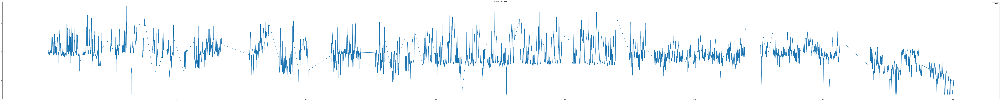

In [107]:
train_y_2018.plot(y='hvac_tot', figsize = (200,20))
plt.title('HVAC Average 2018 Every 30 Min.')
plt.savefig('HVAC Average 2018 Every 30 Min')

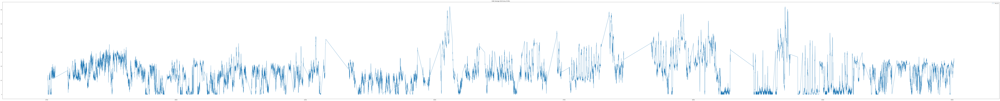

In [108]:
train_y_2019.plot(y='hvac_tot', figsize = (200,20))
plt.title('HVAC Average 2019 Every 30 Min.')
plt.savefig('HVAC Average 2019 Every 30 Min')

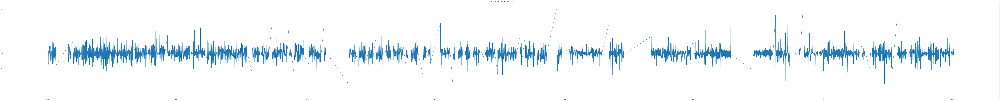

In [109]:
train_y_2019['hvac_tot'].diff().plot(y='hvac_tot', figsize = (200,20))
plt.title('HVAC Average 2019 Differenced Every 30 Min.')
plt.savefig('HVAC Average 2019 Differenced Every 30 Min')

# Averaging Per Day

In [164]:
both_yrs.head()

,Year,DOW,TOD,Hour,air_temp_set_1,air_temp_set_2,dew_point_temperature_set_1d,relative_humidity_set_1,solar_radiation_set_1
0,2018,7,5,0,11.565,11.465,8.120,79.585,66.290
1,2018,7,5,0,11.515,11.460,8.160,80.060,36.525
2,2018,7,5,1,11.030,11.080,8.015,81.850,4.130
3,2018,7,5,1,10.750,10.785,7.975,83.150,0.120
4,2018,7,5,2,10.785,10.835,7.975,82.950,0.000


In [184]:
both_sets.head()

,Year,Time,TOD,DOW,Hour,Date,hvac_tot
0,2018,00:00:00,5,7,0,2018-01-01,29.250000
1,2018,00:30:00,5,7,0,2018-01-01,28.450001
2,2018,01:00:00,5,7,1,2018-01-01,28.572500
3,2018,01:30:00,5,7,1,2018-01-01,28.347500
4,2018,02:00:00,5,7,2,2018-01-01,31.050001


In [188]:
day_hvac =both_sets.groupby('Hour').mean()[['hvac_tot']]

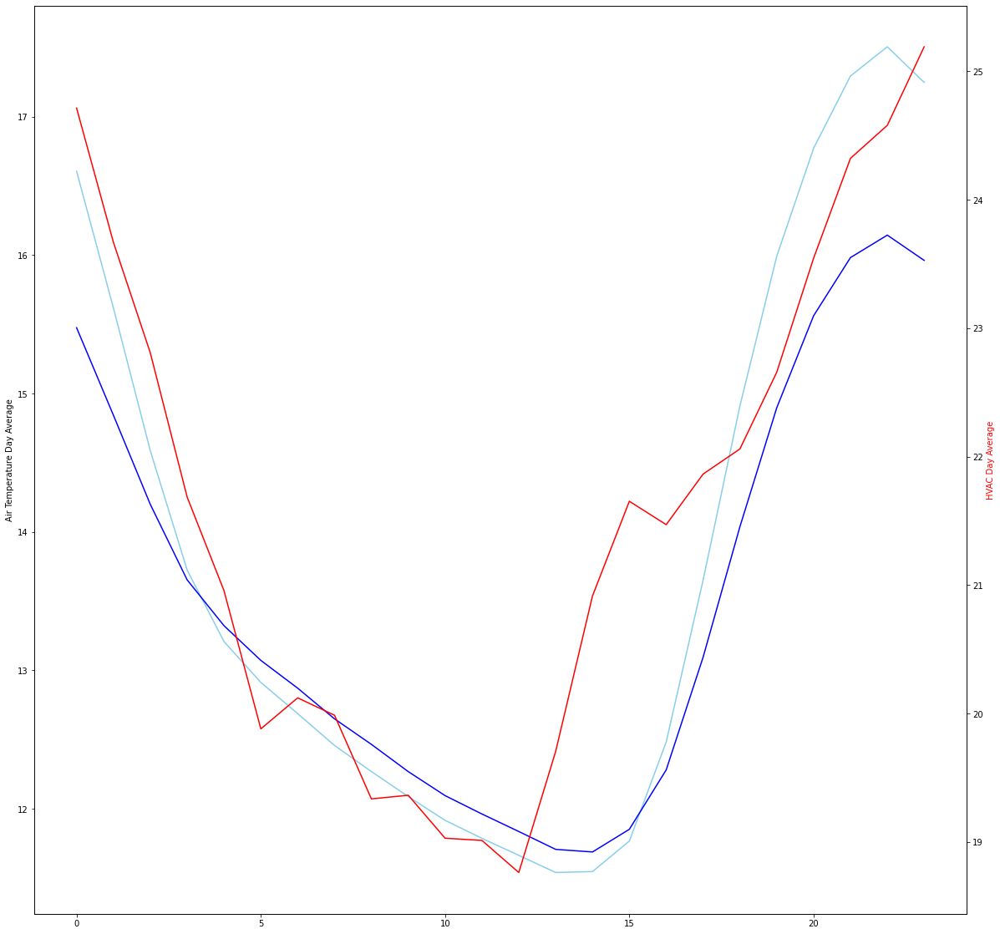

In [199]:
day_average = both_yrs.groupby('Hour').mean().drop(['Year'],axis = 1)
fig,ax1 = plt.subplots(figsize = (20,20))
ax1.plot(day_average['air_temp_set_1'], color= 'skyblue')
ax1.plot(day_average['air_temp_set_2'], color= 'blue')
ax1.set_ylabel('Air Temperature Day Average')
ax2 = ax1.twinx()
ax2.plot(day_hvac, color = 'red')
ax2.set_ylabel('HVAC Day Average', color = 'red')
plt.savefig('DayAverageHVAC+AirTemp')

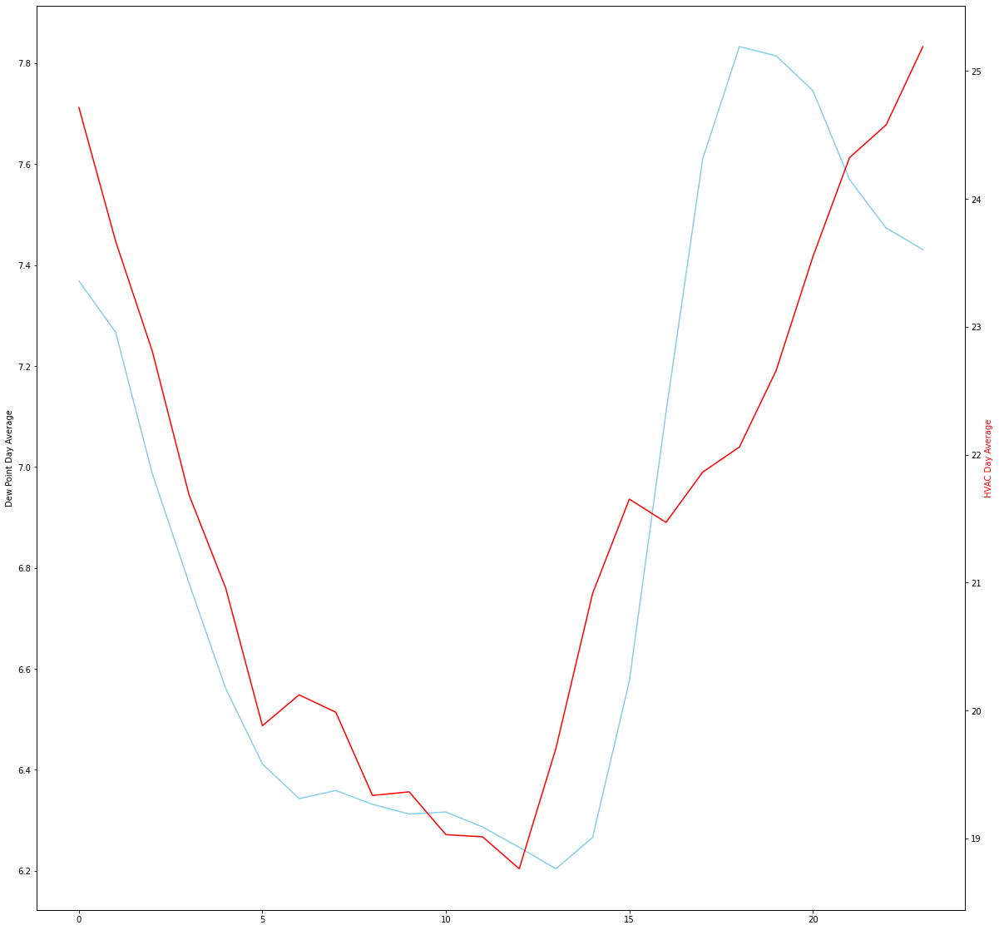

In [201]:
day_average = both_yrs.groupby('Hour').mean().drop(['Year'],axis = 1)
fig,ax1 = plt.subplots(figsize = (20,20))
ax1.plot(day_average['dew_point_temperature_set_1d'], color= 'skyblue')
ax1.set_ylabel('Dew Point Day Average')
ax2 = ax1.twinx()
ax2.plot(day_hvac, color = 'red')
ax2.set_ylabel('HVAC Day Average', color = 'red')
plt.savefig('DayAverageHVAC+DewPoint')

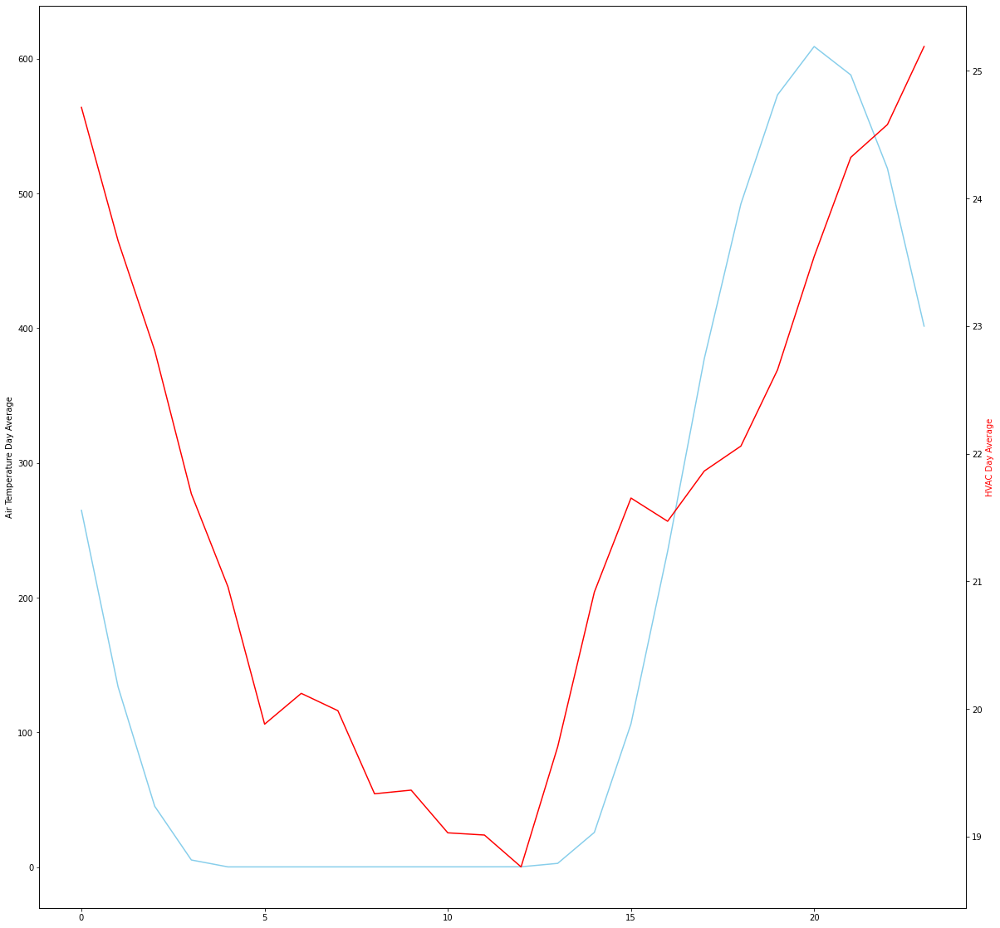

In [200]:
day_average = both_yrs.groupby('Hour').mean().drop(['Year'],axis = 1)
fig,ax1 = plt.subplots(figsize = (20,20))
ax1.plot(day_average['solar_radiation_set_1'], color= 'skyblue')
ax1.set_ylabel('Solar Radiation Day Average')
ax2 = ax1.twinx()
ax2.plot(day_hvac, color = 'red')
ax2.set_ylabel('HVAC Day Average', color = 'red')
plt.savefig('DayAverageHVAC+Solar')

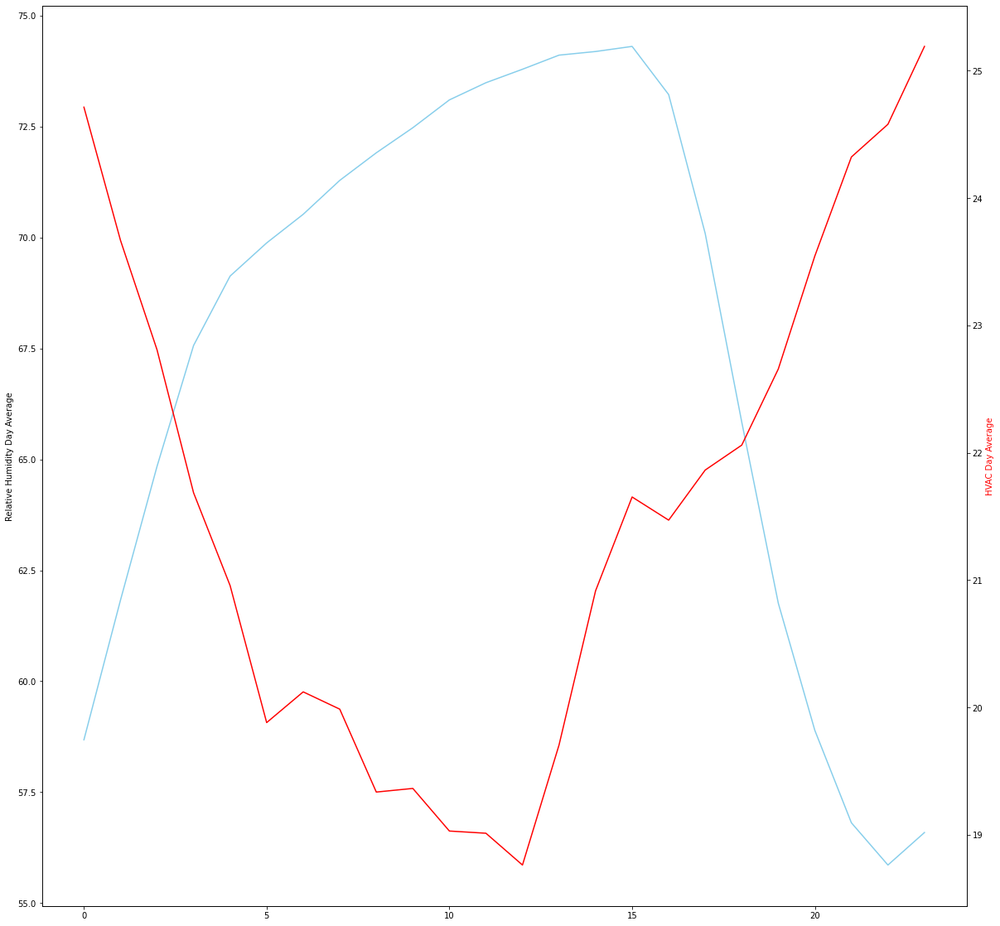

In [202]:
day_average = both_yrs.groupby('Hour').mean().drop(['Year'],axis = 1)
fig,ax1 = plt.subplots(figsize = (20,20))
ax1.plot(day_average['relative_humidity_set_1'], color= 'skyblue')
ax1.set_ylabel('Relative Humidity Day Average')
ax2 = ax1.twinx()
ax2.plot(day_hvac, color = 'red')
ax2.set_ylabel('HVAC Day Average', color = 'red')
plt.savefig('DayAverageHVAC+Humidity')

# Averaging Per Week

In [218]:
week_avg_x = both_yrs.groupby('DOW').mean()
week_avg_y = both_sets.groupby('DOW').mean()
week_avg_x

,Year,TOD,Hour,air_temp_set_1,air_temp_set_2,dew_point_temperature_set_1d,relative_humidity_set_1,solar_radiation_set_1
DOW,,,,,,,,
1,2018.536232,2.958333,11.500000,13.650178,13.297628,6.624496,66.834090,178.644345
2,2018.545848,2.958886,11.496889,13.655158,13.309336,7.152420,69.176500,177.886519
3,2018.527027,2.958333,11.500000,14.017929,13.635639,6.962347,67.964802,178.150892
4,2018.526316,2.958333,11.500000,13.885148,13.505707,6.746453,66.933344,190.715758
5,2018.536585,2.958333,11.500000,14.200784,13.842762,7.042378,66.707431,190.554949
6,2018.449275,2.958333,11.500000,13.716831,13.426594,6.948902,68.123370,183.333092
7,2018.500000,2.958333,11.500000,13.728546,13.415116,6.681951,66.882362,177.144003


In [224]:
week_avg_y

,Year,TOD,Hour,hvac_tot
DOW,,,,
1,2018.536232,2.958333,11.500000,22.193226
2,2018.545848,2.958886,11.496889,20.835491
3,2018.527027,2.958333,11.500000,22.476112
4,2018.526316,2.958333,11.500000,23.110468
5,2018.536585,2.958333,11.500000,19.565661
6,2018.449275,2.958333,11.500000,21.023673
7,2018.500000,2.958333,11.500000,21.857337


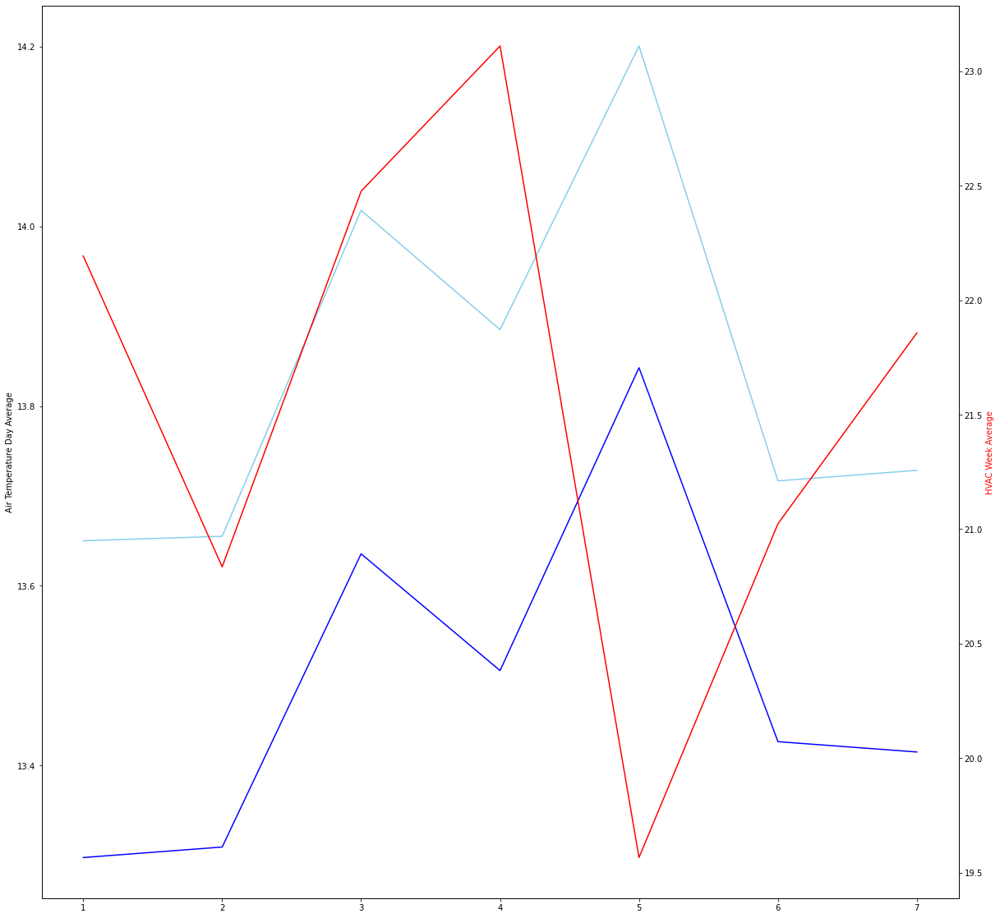

In [219]:
fig,ax1 = plt.subplots(figsize = (20,20))
ax1.plot(week_avg_x['air_temp_set_1'], color= 'skyblue')
ax1.plot(week_avg_x['air_temp_set_2'], color= 'blue')

ax1.set_ylabel('Air Temperature Day Average')
ax2 = ax1.twinx()
ax2.plot(week_avg_y['hvac_tot'], color = 'red')
ax2.set_ylabel('HVAC Week Average', color = 'red')
plt.savefig('WeekAverageHVAC+AirTemp')

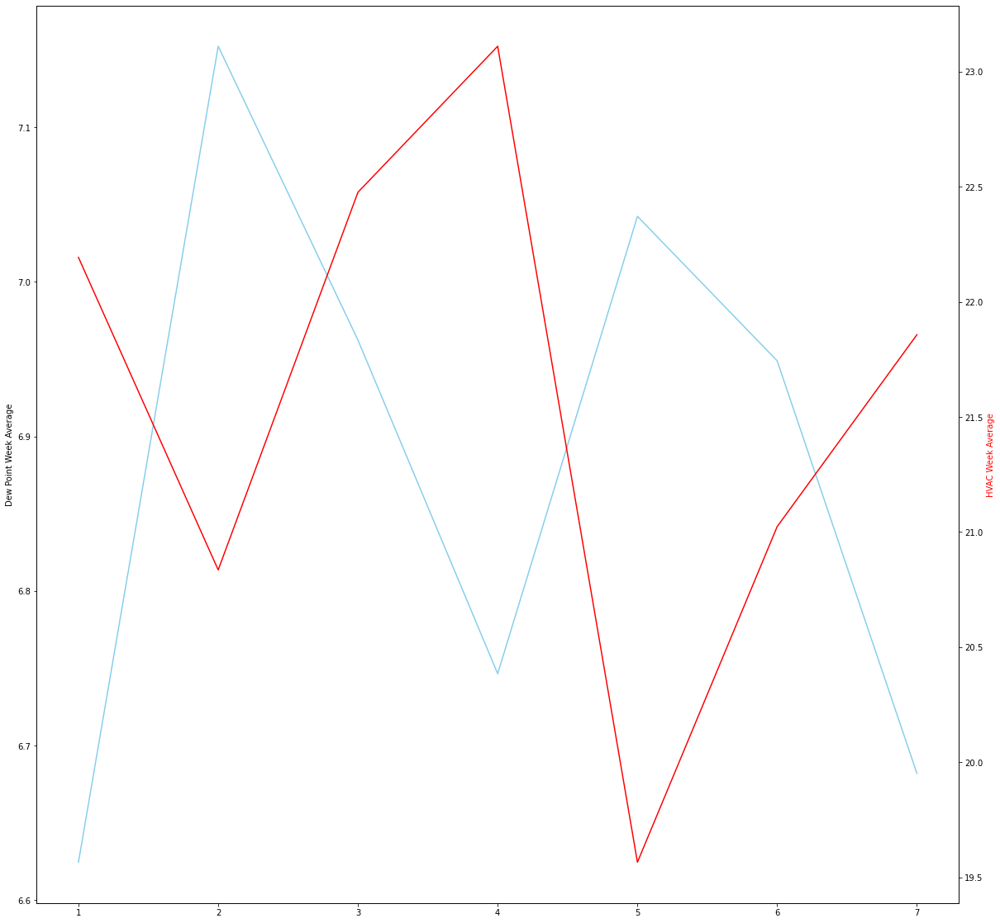

In [222]:
fig,ax1 = plt.subplots(figsize = (20,20))
ax1.plot(week_avg_x['dew_point_temperature_set_1d'], color= 'skyblue')

ax1.set_ylabel('Dew Point Week Average')
ax2 = ax1.twinx()
ax2.plot(week_avg_y['hvac_tot'], color = 'red')
ax2.set_ylabel('HVAC Week Average', color = 'red')
plt.savefig('WeekAverageHVAC+DewPoint')

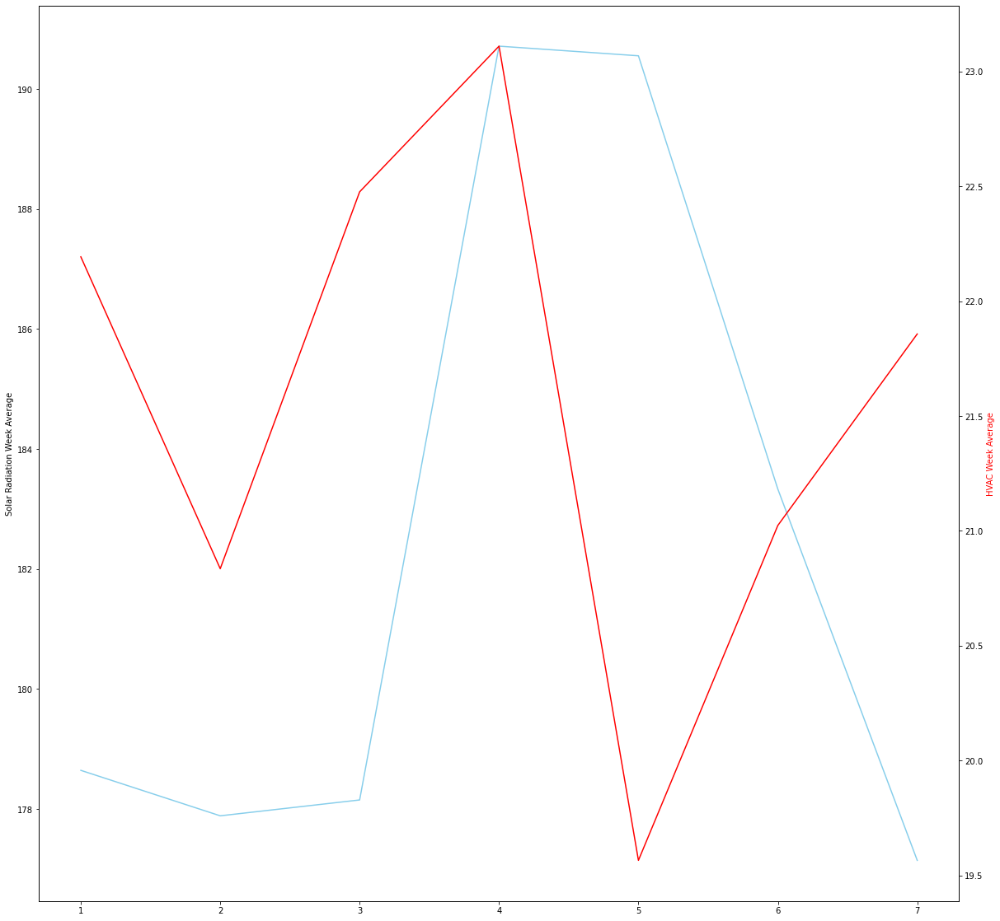

In [225]:
fig,ax1 = plt.subplots(figsize = (20,20))
ax1.plot(week_avg_x['solar_radiation_set_1'], color= 'skyblue')

ax1.set_ylabel('Solar Radiation Week Average')
ax2 = ax1.twinx()
ax2.plot(week_avg_y['hvac_tot'], color = 'red')
ax2.set_ylabel('HVAC Week Average', color = 'red')
plt.savefig('WeekAverageHVAC+Solar')

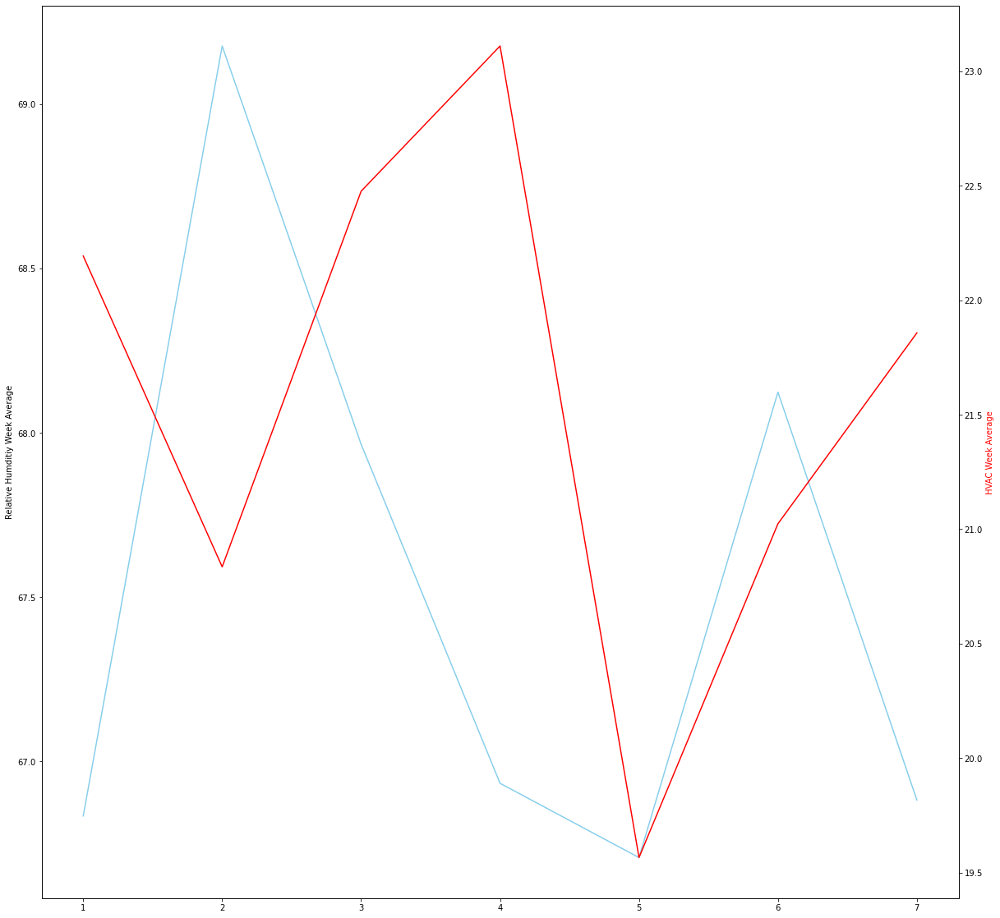

In [226]:
fig,ax1 = plt.subplots(figsize = (20,20))
ax1.plot(week_avg_x['relative_humidity_set_1'], color= 'skyblue')

ax1.set_ylabel('Relative Humditiy Week Average')
ax2 = ax1.twinx()
ax2.plot(week_avg_y['hvac_tot'], color = 'red')
ax2.set_ylabel('HVAC Week Average', color = 'red')
plt.savefig('WeekAverageHVAC+Humidity')

# PCA Analysis

In [117]:
u,s,v = np.linalg.svd(x_2018)
s

array([3.72078243e+04, 7.10169391e+03, 9.31740380e+02, 6.47970080e+02,
       3.80660459e+02, 2.15671993e+02, 1.39930380e+02, 2.01848083e+01])

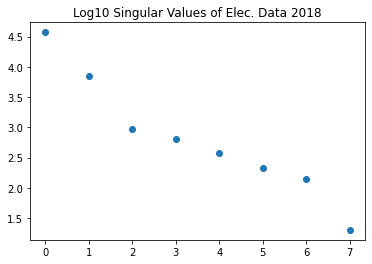

In [118]:

plt.scatter(x = np.arange(8),y = np.log10(s))
plt.title('Log10 Singular Values of Elec. Data 2018')
plt.savefig('SVD of Weather Data 2018')
plt.show()


In [119]:
u,s,v = np.linalg.svd(x_2019)
s

array([36276.02678332,  7355.39212885,  1065.61181077,   669.18863871,
         416.4479268 ,   224.00381371,   150.70718014,    64.82536401])

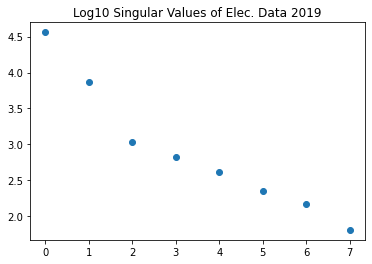

In [121]:

plt.scatter(x = np.arange(8),y = np.log10(s))
plt.title('Log10 Singular Values of Elec. Data 2019')
plt.savefig('SVD of Weather Data 2019')
plt.show()


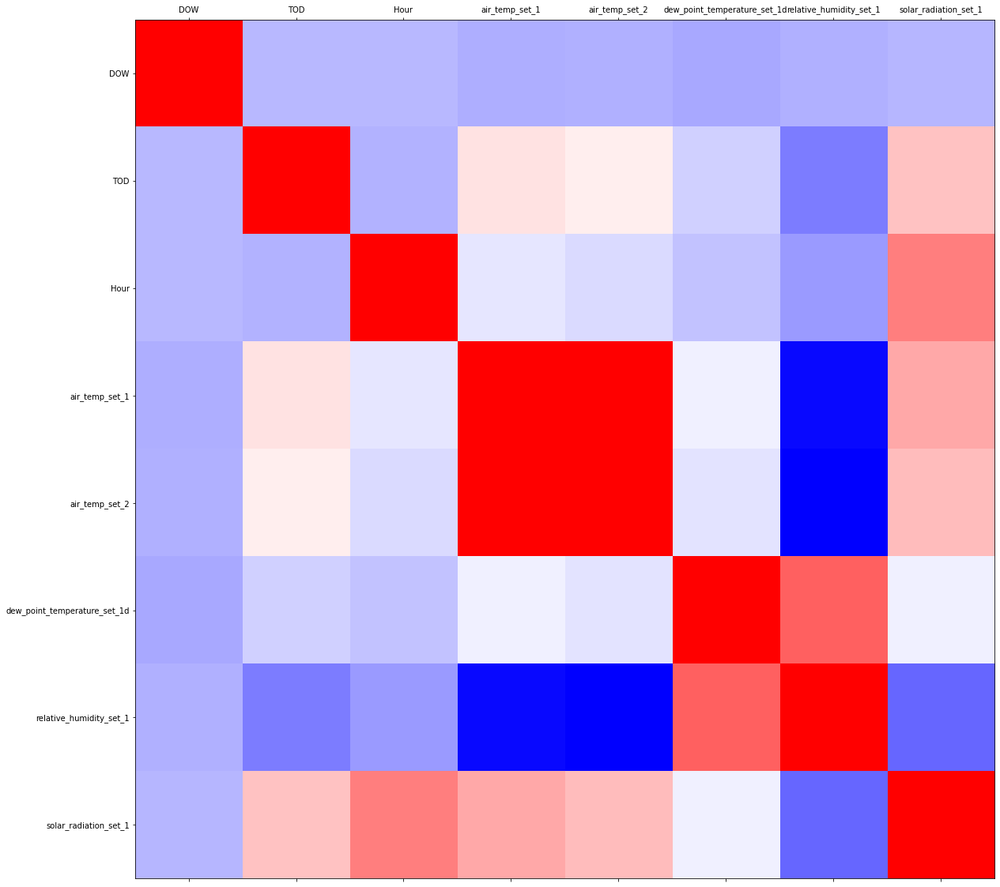

In [122]:
fig, ax = plt.subplots(figsize=(20,20))
ax.matshow(train_x_2018.drop(columns = ['Year']).corr(), cmap='bwr')
plt.yticks(ticks = range(8),labels = ['DOW','TOD',	'Hour','air_temp_set_1',	'air_temp_set_2',	'dew_point_temperature_set_1d',	'relative_humidity_set_1','solar_radiation_set_1'])

plt.xticks(ticks = range(8),labels = ['DOW','TOD',	'Hour','air_temp_set_1',	'air_temp_set_2',	'dew_point_temperature_set_1d',	'relative_humidity_set_1','solar_radiation_set_1'])
plt.savefig('Covariance Matrix Weather')
plt.show()


In [124]:
train_x_2018.drop(columns=['Year']).corr()

,DOW,TOD,Hour,air_temp_set_1,air_temp_set_2,dew_point_temperature_set_1d,relative_humidity_set_1,solar_radiation_set_1
DOW,1.000000e+00,4.003911e-17,-1.478676e-17,-0.029199,-0.025684,-0.048214,-0.025535,-0.006706
TOD,4.003911e-17,1.000000e+00,-1.418247e-02,0.303860,0.270070,0.074479,-0.183199,0.402787
Hour,-1.478676e-17,-1.418247e-02,1.000000e+00,0.143769,0.107731,0.033447,-0.092340,0.611600
air_temp_set_1,-2.919871e-02,3.038595e-01,1.437694e-01,1.000000,0.994792,0.171785,-0.538537,0.485691
air_temp_set_2,-2.568422e-02,2.700705e-01,1.077313e-01,0.994792,1.000000,0.134598,-0.563726,0.420602
dew_point_temperature_set_1d,-4.821356e-02,7.447868e-02,3.344727e-02,0.171785,0.134598,1.000000,0.702993,0.169724
relative_humidity_set_1,-2.553490e-02,-1.831992e-01,-9.234004e-02,-0.538537,-0.563726,0.702993,1.000000,-0.246200
solar_radiation_set_1,-6.706460e-03,4.027869e-01,6.116002e-01,0.485691,0.420602,0.169724,-0.246200,1.000000


In [125]:
pca = PCA(n_components = 3)
pca_points = pca.fit_transform(x_2018[:,1:])

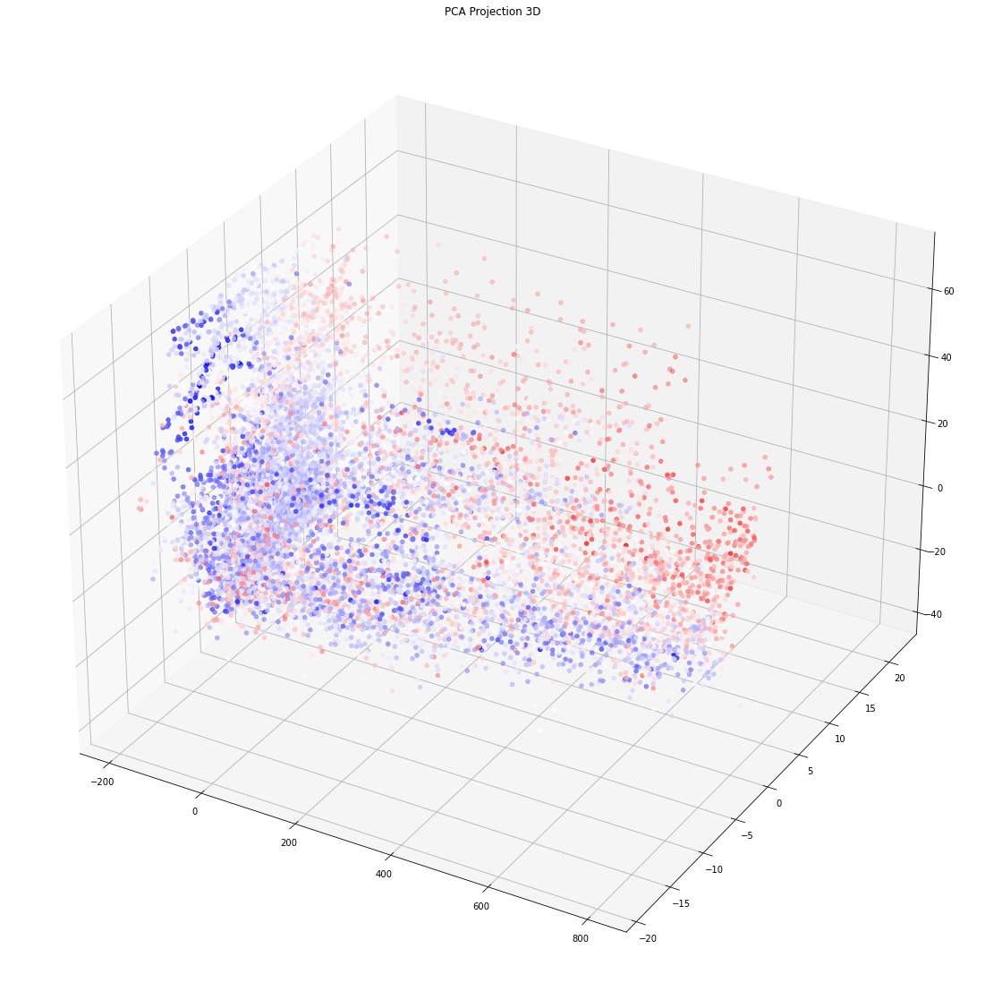

In [129]:
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(pca_points[:,0],pca_points[:,2],pca_points[:,1], c=y_2018/np.linalg.norm(y_2018), cmap='bwr')
ax.set_title('PCA Projection 3D')
plt.savefig('PCA_Projection 3 Components')

# Initial LinearRegression Model

In [130]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

In [131]:
tr_x_2018 = x_2018[:round(len(x_2018)*.8),:]
tr_y_2018 = y_2018[:round(len(x_2018)*.8),:]
te_x_2018 = x_2018[round(len(x_2018)*.8):,:]
te_y_2018 = y_2018[round(len(x_2018)*.8):,:]
tr_y_2018

array([[29.25      ],
       [28.45000076],
       [28.57250023],
       ...,
       [27.3609375 ],
       [28.71868132],
       [31.31989583]])

In [132]:
tr_x_2019 = x_2019[:round(len(x_2019)*.8),:]
tr_y_2019 = y_2019[:round(len(x_2019)*.8),:]
te_x_2019 = x_2019[round(len(x_2019)*.8):,:]
te_y_2019= y_2019[round(len(x_2019)*.8):,:]
tr_y_2019

array([[1.51530154],
       [0.795     ],
       [1.39086988],
       ...,
       [0.        ],
       [0.        ],
       [0.44375   ]])

In [135]:
lr = RandomForestRegressor(200,n_jobs = -1)
lr.fit(tr_x_2019,tr_y_2019.ravel())
pred = lr.predict(te_x_2019)
R2 = lr.score(te_x_2019, te_y_2019.ravel())
print(R2)
mean_squared_error(te_y_2019.ravel(),pred, squared=False)


-0.028342034879458744


3.4057944329594796

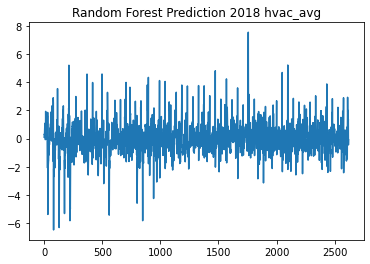

In [136]:
plt.plot(pred)
plt.title('Random Forest Prediction 2018 hvac_avg')
plt.savefig('2019 Prediction Diff')

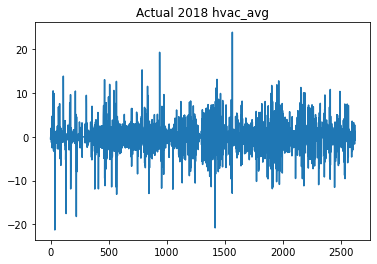

In [138]:
plt.plot(te_y_2019)
plt.title('Actual 2018 hvac_avg')
plt.savefig('2019 Actual Diff')

# PCA Transform For Regression

In [146]:
te_y_2019

array([[-0.44375   ],
       [ 0.        ],
       [ 0.        ],
       ...,
       [ 2.71959137],
       [-0.76104532],
       [ 0.59625   ]])

In [159]:
pca = PCA(7)
pca_2019 = pca.fit_transform(x_2019)

In [160]:
pca_train_x = pca_2019[:round(len(pca_2019)*.8),:]
pca_test_x = pca_2019[round(len(pca_2019)*.8):,:]

In [161]:
lr = RandomForestRegressor(200,n_jobs = -1)
lr.fit(pca_train_x,tr_y_2019.ravel())
pred = lr.predict(pca_test_x)
R2 = lr.score(pca_test_x, te_y_2019.ravel())
print(R2)
mean_squared_error(te_y_2019.ravel(),pred, squared=False)


-0.03550040345615746


3.4176278747547246

# Kernel PCA Transform for Regression

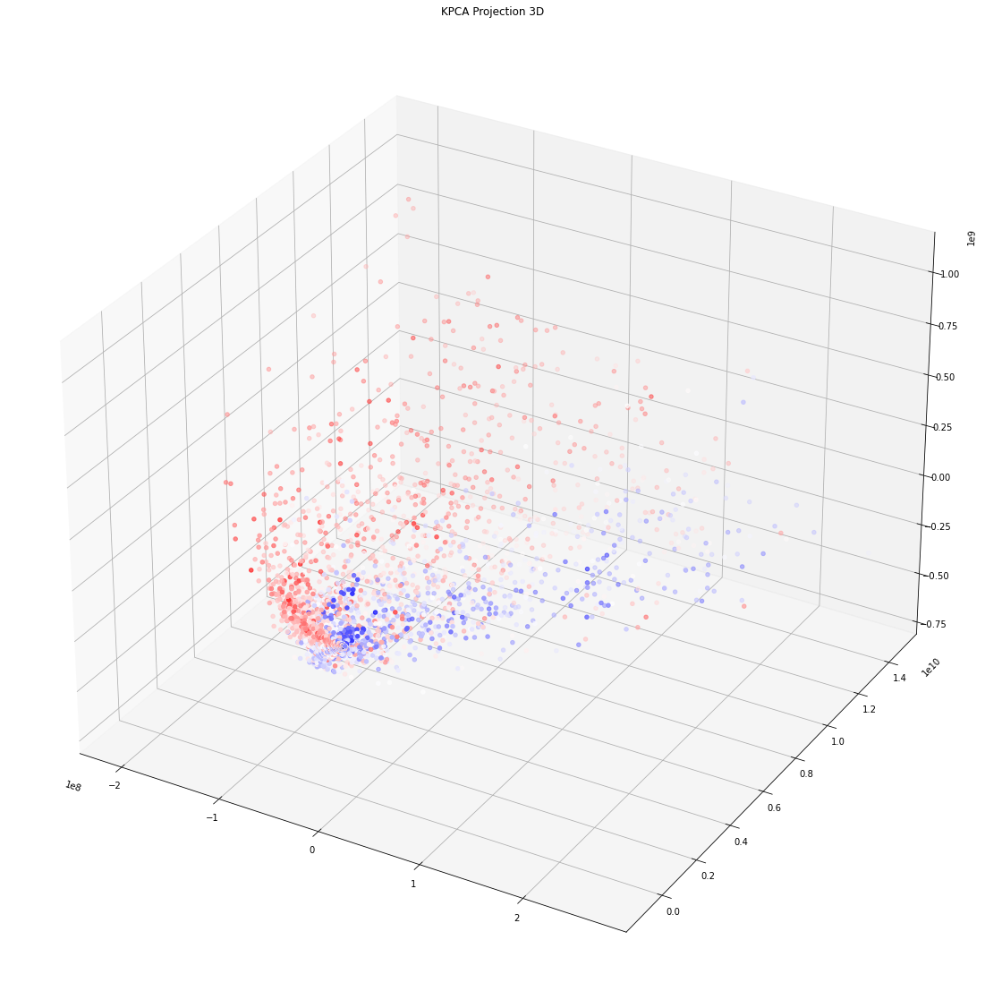

In [162]:
kpca = KernelPCA(3, kernel= 'poly', degree =4, )
kpca_x = kpca.fit_transform(x_2018)
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(kpca_x[:,2],kpca_x[:,0],kpca_x[:,1], c=y_2018/np.linalg.norm(y_2018), cmap='bwr')
ax.set_title('KPCA Projection 3D')
plt.savefig('KPCA_Projection 3 Components')